In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import pandas_profiling

In [2]:
import itertools
import seaborn as sns
import statsmodels.formula.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from sklearn import datasets
from sklearn.feature_selection import RFE
import sklearn.metrics as metrics
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif

In [3]:
train=pd.read_csv('NSL_Dataset\Train.txt',sep=',')

In [4]:
test=pd.read_csv('NSL_Dataset\Test.txt',sep=',')

In [5]:
train.head()

,0,tcp,ftp_data,SF,491,0.1,0.2,0.3,0.4,0.5,...,0.17.1,0.03,0.17.2,0.00.6,0.00.7,0.00.8,0.05,0.00.9,normal,20
0,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19
2,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21
3,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21


In [6]:
columns=["duration","protocol_type","service","flag","src_bytes","dst_bytes","land","wrong_fragment","urgent","hot",
         "num_failed_logins","logged_in","num_compromised","root_shell","su_attempted","num_root","num_file_creations", 
         "num_shells","num_access_files","num_outbound_cmds","is_host_login","is_guest_login","count","srv_count","serror_rate",
         "srv_serror_rate","rerror_rate","srv_rerror_rate","same_srv_rate","diff_srv_rate","srv_diff_host_rate",
         "dst_host_count","dst_host_srv_count","dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate",
         "dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate","dst_host_rerror_rate",
         "dst_host_srv_rerror_rate","attack","last_flag"] 

In [7]:
len(columns)

43

In [8]:
train.columns=columns

In [9]:
test.columns=columns

In [10]:
train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19
2,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21
3,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21


In [11]:
test.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal,21
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,saint,15
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,mscan,11
4,0,tcp,http,SF,267,14515,0,0,0,0,...,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal,21


In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125972 entries, 0 to 125971
Data columns (total 43 columns):
duration                       125972 non-null int64
protocol_type                  125972 non-null object
service                        125972 non-null object
flag                           125972 non-null object
src_bytes                      125972 non-null int64
dst_bytes                      125972 non-null int64
land                           125972 non-null int64
wrong_fragment                 125972 non-null int64
urgent                         125972 non-null int64
hot                            125972 non-null int64
num_failed_logins              125972 non-null int64
logged_in                      125972 non-null int64
num_compromised                125972 non-null int64
root_shell                     125972 non-null int64
su_attempted                   125972 non-null int64
num_root                       125972 non-null int64
num_file_creations             125972 

In [13]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22543 entries, 0 to 22542
Data columns (total 43 columns):
duration                       22543 non-null int64
protocol_type                  22543 non-null object
service                        22543 non-null object
flag                           22543 non-null object
src_bytes                      22543 non-null int64
dst_bytes                      22543 non-null int64
land                           22543 non-null int64
wrong_fragment                 22543 non-null int64
urgent                         22543 non-null int64
hot                            22543 non-null int64
num_failed_logins              22543 non-null int64
logged_in                      22543 non-null int64
num_compromised                22543 non-null int64
root_shell                     22543 non-null int64
su_attempted                   22543 non-null int64
num_root                       22543 non-null int64
num_file_creations             22543 non-null int64
num_

In [14]:
#So, no missings in train & test.

In [15]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,125972.0,287.146929,2.604526e+03,0.0,0.00,0.00,0.00,4.290800e+04
src_bytes,125972.0,45567.100824,5.870354e+06,0.0,0.00,44.00,276.00,1.379964e+09
dst_bytes,125972.0,19779.271433,4.021285e+06,0.0,0.00,0.00,516.00,1.309937e+09
land,125972.0,0.000198,1.408613e-02,0.0,0.00,0.00,0.00,1.000000e+00
wrong_fragment,125972.0,0.022688,2.535310e-01,0.0,0.00,0.00,0.00,3.000000e+00
urgent,125972.0,0.000111,1.436608e-02,0.0,0.00,0.00,0.00,3.000000e+00
hot,125972.0,0.204411,2.149977e+00,0.0,0.00,0.00,0.00,7.700000e+01
num_failed_logins,125972.0,0.001222,4.523932e-02,0.0,0.00,0.00,0.00,5.000000e+00
logged_in,125972.0,0.395739,4.890107e-01,0.0,0.00,0.00,1.00,1.000000e+00
num_compromised,125972.0,0.279253,2.394214e+01,0.0,0.00,0.00,0.00,7.479000e+03


In [16]:
# In attack_class if activity is normal means 0 & attack means 1.

In [17]:
train.loc[train.attack=='normal','attack_class']=0

train.loc[train.attack!='normal','attack_class']=1

In [18]:
train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag,attack_class
0,0,udp,other,SF,146,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15,0.0
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19,1.0
2,0,tcp,http,SF,232,8153,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21,0.0
3,0,tcp,http,SF,199,420,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21,0.0
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21,1.0


In [19]:
test.loc[test.attack=='normal','attack_class']=0

test.loc[test.attack!='normal','attack_class']=1

In [20]:
test.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag,attack_class
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21,1.0
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal,21,0.0
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,0.00,1.00,0.28,0.00,0.0,0.00,0.00,saint,15,1.0
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.17,0.03,0.02,0.00,0.0,0.83,0.71,mscan,11,1.0
4,0,tcp,http,SF,267,14515,0,0,0,0,...,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal,21,0.0


In [21]:
pandas_profiling.ProfileReport(train)

In [22]:
pandas_profiling.ProfileReport(test)

# Seperating Categorical & Numerical Variables

In [18]:
numeric_var_names=[key for key in dict(train.dtypes) if dict(train.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]
cat_var_names=[key for key in dict(train.dtypes) if dict(train.dtypes)[key] in ['object', 'O']]

In [19]:
numeric_var_names

['duration',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'num_outbound_cmds',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'last_flag',
 'attack_class']

In [20]:
cat_var_names

['protocol_type', 'service', 'flag', 'attack']

In [21]:
train_num=train[numeric_var_names]
train_num.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag,attack_class
0,0,146,0,0,0,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,15,0.0
1,0,0,0,0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,19,1.0
2,0,232,8153,0,0,0,0,0,1,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,21,0.0
3,0,199,420,0,0,0,0,0,1,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,21,0.0
4,0,0,0,0,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,21,1.0


In [22]:
train_cat=train[cat_var_names]
train_cat.head()

,protocol_type,service,flag,attack
0,udp,other,SF,normal
1,tcp,private,S0,neptune
2,tcp,http,SF,normal
3,tcp,http,SF,normal
4,tcp,private,REJ,neptune


In [23]:
test_num=test[numeric_var_names]
test_num.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag,attack_class
0,0,0,0,0,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,21,1.0
1,2,12983,0,0,0,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,21,0.0
2,0,20,0,0,0,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,15,1.0
3,1,0,15,0,0,0,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,11,1.0
4,0,267,14515,0,0,0,0,0,1,0,...,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,21,0.0


In [24]:
test_cat=test[cat_var_names]
test_cat.head(5)

,protocol_type,service,flag,attack
0,tcp,private,REJ,neptune
1,tcp,ftp_data,SF,normal
2,icmp,eco_i,SF,saint
3,tcp,telnet,RSTO,mscan
4,tcp,http,SF,normal


# Data Audit Report

In [25]:
# Creating Data audit Report
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

num_summary=train_num.apply(lambda x: var_summary(x)).T
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
duration,125972.0,0.0,3.617247e+07,287.146929,0.00,2.604526e+03,6.783553e+06,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4.00,9590.58,4.290800e+04
src_bytes,125972.0,0.0,5.740179e+09,45567.100824,44.00,5.870354e+06,3.446106e+13,0.0,0.0,0.00,0.00,0.00,44.00,276.00,848.00,1480.00,54540.00,1.379964e+09
dst_bytes,125972.0,0.0,2.491634e+09,19779.271433,0.00,4.021285e+06,1.617073e+13,0.0,0.0,0.00,0.00,0.00,0.00,516.00,3375.90,8314.00,25519.00,1.309937e+09
land,125972.0,0.0,2.500000e+01,0.000198,0.00,1.408613e-02,1.984190e-04,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.000000e+00
wrong_fragment,125972.0,0.0,2.858000e+03,0.022688,0.00,2.535310e-01,6.427796e-02,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
urgent,125972.0,0.0,1.400000e+01,0.000111,0.00,1.436608e-02,2.063844e-04,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
hot,125972.0,0.0,2.575000e+04,0.204411,0.00,2.149977e+00,4.622401e+00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,7.700000e+01
num_failed_logins,125972.0,0.0,1.540000e+02,0.001222,0.00,4.523932e-02,2.046596e-03,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.000000e+00
logged_in,125972.0,0.0,4.985200e+04,0.395739,0.00,4.890107e-01,2.391315e-01,0.0,0.0,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.000000e+00
num_compromised,125972.0,0.0,3.517800e+04,0.279253,0.00,2.394214e+01,5.732259e+02,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,7.479000e+03


# Handling Outliers

In [26]:
def outlier_capping(x):
    x = x.clip(upper=x.quantile(0.99))
    x = x.clip(lower=x.quantile(0.01))
    return x

train_num=train_num.apply(outlier_capping)
test_num=test_num.apply(outlier_capping)

# Handling Missings
### As there is no missings in train_num & test_num so, no need of handling missings

In [27]:
def cat_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.value_counts()], 
                  index=['N', 'NMISS', 'ColumnsNames'])

cat_summary=train_cat.apply(cat_summary)
cat_summary

,protocol_type,service,flag,attack
N,125972,125972,125972,125972
NMISS,0,0,0,0
ColumnsNames,tcp 102688 udp 14993 icmp 8291 N...,http 40338 private 21853 doma...,SF 74944 S0 34851 REJ 1123...,normal 67342 neptune 41...


# Dummy Variable Creation

In [28]:
# An utility function to create dummy variable
def create_dummies( df, colname ):
    col_dummies = pd.get_dummies(df[colname], prefix=colname, drop_first=True)
    df = pd.concat([df, col_dummies], axis=1)
    df.drop( colname, axis = 1, inplace = True )
    return(df)

In [29]:
for columns in cat_var_names:
    train_cat = create_dummies(train_cat,columns)

train_cat.head()

,protocol_type_tcp,protocol_type_udp,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,...,attack_phf,attack_pod,attack_portsweep,attack_rootkit,attack_satan,attack_smurf,attack_spy,attack_teardrop,attack_warezclient,attack_warezmaster
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
for columns in cat_var_names:
    test_cat = create_dummies(test_cat,columns)

test_cat.head()

,protocol_type_tcp,protocol_type_udp,service_X11,service_Z39_50,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,...,attack_snmpgetattack,attack_snmpguess,attack_sqlattack,attack_teardrop,attack_udpstorm,attack_warezmaster,attack_worm,attack_xlock,attack_xsnoop,attack_xterm
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Final data set

In [31]:
train_new = pd.concat([train_num, train_cat], axis=1)
train_new.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,attack_phf,attack_pod,attack_portsweep,attack_rootkit,attack_satan,attack_smurf,attack_spy,attack_teardrop,attack_warezclient,attack_warezmaster
0,0.0,146.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,232.0,8153.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,199.0,420.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [32]:
test_new = pd.concat([test_num, test_cat], axis=1)
test_new.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,attack_snmpgetattack,attack_snmpguess,attack_sqlattack,attack_teardrop,attack_udpstorm,attack_warezmaster,attack_worm,attack_xlock,attack_xsnoop,attack_xterm
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2.0,12983.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,1.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,267.0,14515.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0


# correlation metrics

In [33]:
corr_metrics_binomial=train_new.corr()
corr_metrics_binomial

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,attack_phf,attack_pod,attack_portsweep,attack_rootkit,attack_satan,attack_smurf,attack_spy,attack_teardrop,attack_warezclient,attack_warezmaster
duration,1.000000,0.011740,0.036892,NaN,NaN,NaN,0.021274,NaN,-0.064538,0.062081,...,-0.000757,-0.005534,0.408874,-0.000414,-0.023837,-0.020279,0.000605,-0.011691,0.037013,-0.001571
src_bytes,0.011740,1.000000,0.127827,NaN,NaN,NaN,0.379973,NaN,0.163275,0.603363,...,-0.000898,0.002845,-0.022114,-0.001067,-0.028784,-0.002928,-0.000555,-0.013779,0.047995,-0.002012
dst_bytes,0.036892,0.127827,1.000000,NaN,NaN,NaN,0.127002,NaN,0.421999,0.237363,...,0.010050,-0.014104,-0.053377,0.006873,-0.060374,-0.051676,-0.000156,-0.029791,-0.011541,0.064962
land,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wrong_fragment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
urgent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hot,0.021274,0.379973,0.127002,NaN,NaN,NaN,1.000000,NaN,0.168937,0.423630,...,0.031240,-0.005627,-0.020526,0.003811,-0.022771,-0.020616,-0.000561,-0.011886,0.270177,0.003599
num_failed_logins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
logged_in,-0.064538,0.163275,0.421999,NaN,NaN,NaN,0.168937,NaN,1.000000,0.125493,...,0.006963,-0.032352,-0.124581,0.001900,-0.134123,-0.118539,0.000850,-0.068341,0.104233,-0.007621
num_compromised,0.062081,0.603363,0.237363,NaN,NaN,NaN,0.423630,NaN,0.125493,1.000000,...,-0.000572,-0.004060,-0.015675,0.025687,-0.016085,-0.014876,-0.000405,-0.008576,-0.008567,-0.001280


In [34]:
corr_metrics_binomial.to_csv('corr_metrics_binomial.csv')

# visualize correlation matrix in Seaborn using a heatmap

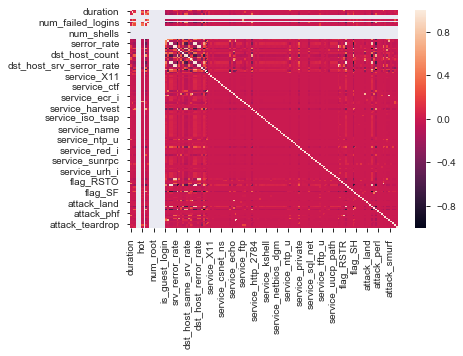

In [37]:
sns.heatmap(corr_metrics_binomial)

### Dropping columns based on pandas profiling,data audit report & correlation metrics
        - Based on low variance (near zero variance)
        - High missings (>25% missings)
        - High correlations between two numerical variables

In [38]:
train_new.drop(columns=['land','wrong_fragment','urgent','num_failed_logins',"root_shell","su_attempted","num_root",
                        "num_file_creations","num_shells","num_access_files","num_outbound_cmds","is_host_login","is_guest_login",
                        'dst_host_rerror_rate','dst_host_serror_rate','dst_host_srv_rerror_rate','dst_host_srv_serror_rate',
                        'num_root','num_outbound_cmds','srv_rerror_rate','srv_serror_rate'], axis=1, inplace=True)

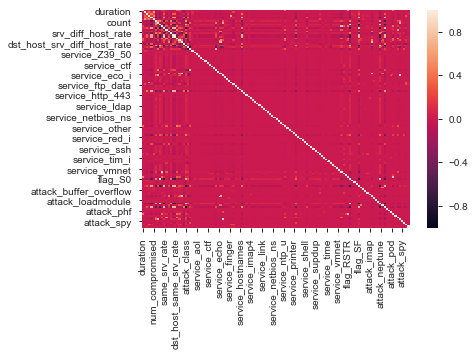

In [39]:
sns.heatmap(train_new.corr())

# Variable reduction using WOE or log(odds)
- Identify important variables using WOE or log(odds) comparing with Y
- Variable Transformation: (i) Bucketing if the variables are not having linear relationship with log(odds)

C:\Users\intel\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.
C:\Users\intel\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


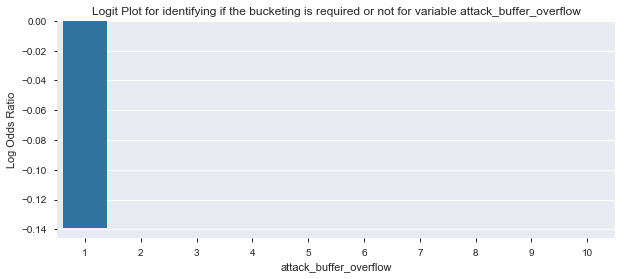

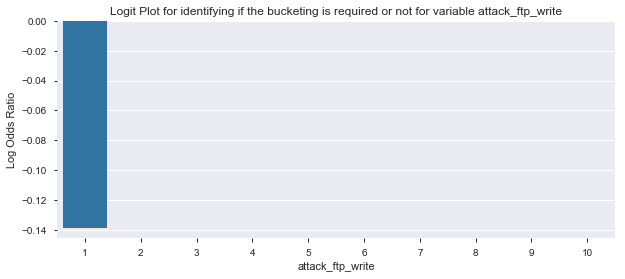

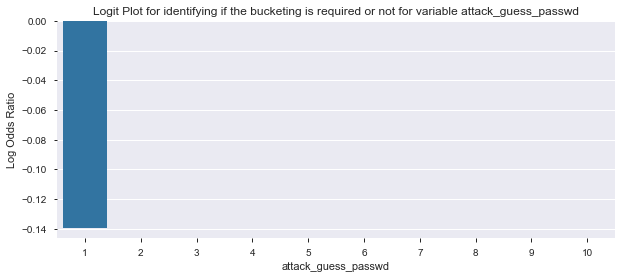

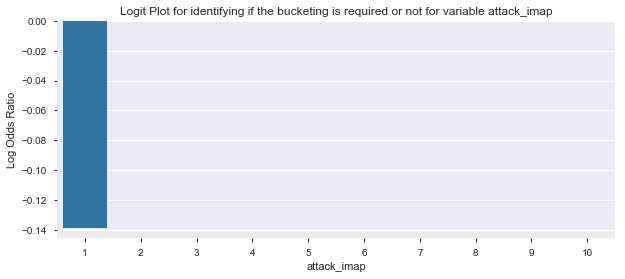

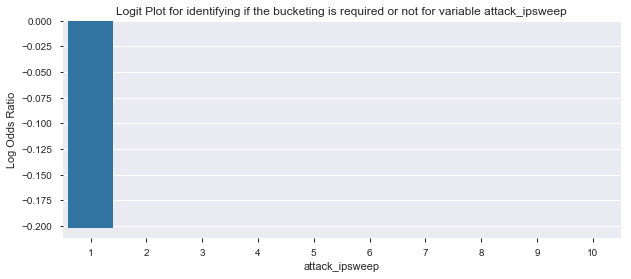

...

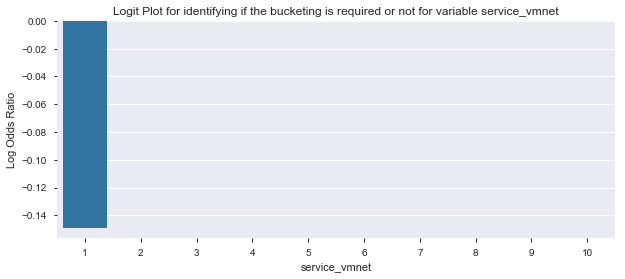

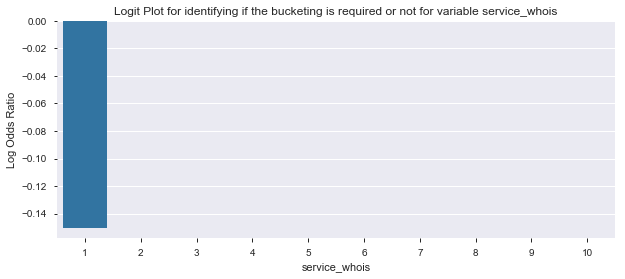

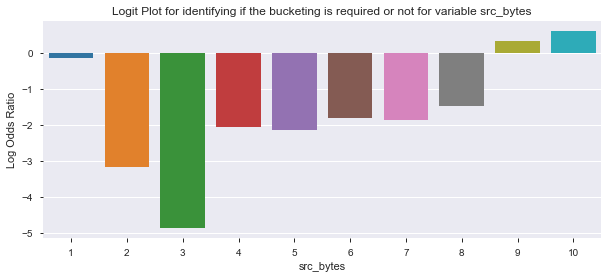

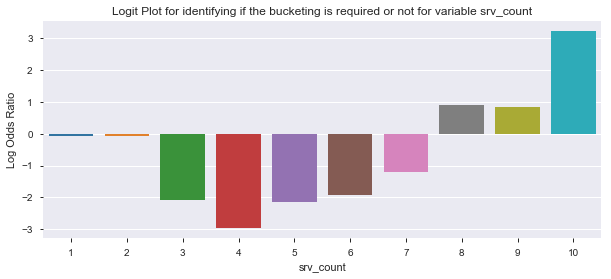

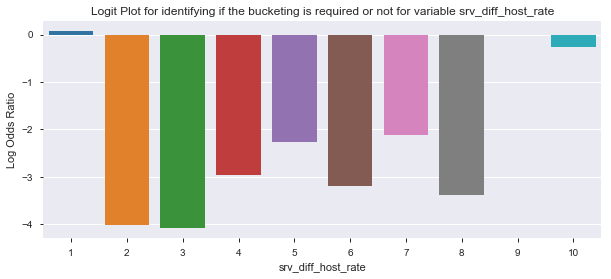

In [40]:
for num_variable in train_new.columns.difference(['attack_class']):
    binned = pd.cut(train_new[num_variable], bins=10, labels=list(range(1,11)))
    odds = train_new.groupby(binned)['attack_class'].sum() / (train_new.groupby(binned)['attack_class'].count()-train_new.groupby(binned)['attack_class'].sum())
    log_odds = np.log(odds)
    fig,axes = plt.subplots(figsize=(10,4))
    sns.barplot(x=log_odds.index,y=log_odds)
    plt.ylabel('Log Odds Ratio')
    plt.title(str('Logit Plot for identifying if the bucketing is required or not for variable ') + str(num_variable))

# Variable Reduction using Recursive Feature Elimination (RFE)

In [41]:
X = train_new[train_new.columns.difference(['attack_class'])]
logreg = LogisticRegression(solver='lbfgs',multi_class='auto')
rfe = RFE(logreg, 15)
rfe = rfe.fit(X, train_new['attack_class'] )
print(rfe.support_)
print(rfe.ranking_)

C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", Convergenc

C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\intel\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", Convergenc

[False False False False  True False False False  True  True  True False
 False False False False  True  True False False  True False False False
 False False False  True False False False False False False False False
  True False False False  True False False False False  True False False
 False  True False False False False False False False False False False
 False False False False False  True False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False  True False False False False False False False False
 False False False False False False False False False False False False
 False False False]
[ 61  93  54  84   1  85  92  95   1   1   1 102  98  25   7  91   1   1
 104   2   1  51  70  26  73  65  17   1  12  68  22  90  27  24  86  21
   1  18  89  79   1  31   5  19   4   1  14   3  13   1  10  29  33 108
  66  38  39  75  40  41  35  6

In [42]:
# capturing the important variables
RFE_features=X.columns[rfe.get_support()]
RFE_features

Index(['attack_ipsweep', 'attack_neptune', 'attack_nmap', 'attack_normal',
       'attack_satan', 'attack_smurf', 'attack_warezclient',
       'dst_host_same_src_port_rate', 'flag_S0', 'flag_SF', 'num_compromised',
       'same_srv_rate', 'service_ecr_i', 'service_http', 'service_private'],
      dtype='object')

# Variable reduction using Select K-Best technique

In [43]:
X = train_new[train_new.columns.difference(['attack_class'])]
X_new = SelectKBest(f_classif, k=15).fit(X, train_new['attack_class'] )

C:\Users\intel\Anaconda3\lib\site-packages\sklearn\feature_selection\univariate_selection.py:115: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


In [44]:
X_new.get_support()

array([False, False, False, False, False, False, False, False,  True,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False,  True, False,  True,  True, False,
       False,  True,  True, False, False, False, False, False, False,
        True, False, False, False,  True, False, False,  True,  True,
       False, False, False, False,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [45]:
X_new.scores_

array([3.44748793e+01, 9.18985102e+00, 6.09295344e+01, 1.26366918e+01,
       4.40406335e+03, 2.06806926e+01, 1.03387588e+01, 8.04098248e+00,
       1.59358585e+05, 1.75963053e+03,            inf, 3.44590023e+00,
       4.59461200e+00, 2.31657689e+02, 3.54362319e+03, 1.14877057e+01,
       4.44841722e+03, 3.18276834e+03, 2.29722763e+00, 1.04035662e+03,
       1.03798802e+03, 2.29793315e+01, 6.26884673e+04, 5.45089904e+03,
       1.15251187e+04, 2.06198087e+04, 7.89806230e+03, 1.08583544e+03,
       1.16922768e+05, 1.37605839e+05, 3.83861124e+02, 1.08570213e+01,
       4.46148376e+03, 9.96492655e+02, 1.18511386e+02, 2.27184161e+03,
       9.22603796e+04, 3.04601678e+02, 8.28019239e+01, 2.90257642e+01,
       1.68329283e+05, 3.04113887e+02, 5.54764666e+00, 2.46145858e+04,
       1.14591302e+05, 3.15027165e+02, 3.56595433e+02, 6.23625227e+03,
       8.64342084e+03, 1.63863933e+05, 9.24800692e+04, 4.31296064e+01,
       1.00484494e+03, 2.29722763e+00, 3.20403824e+02, 8.25484477e+02,
      

In [46]:
# capturing the important variables
KBest_features=X.columns[X_new.get_support()]
KBest_features

Index(['attack_neptune', 'attack_normal', 'count', 'dst_bytes',
       'dst_host_count', 'dst_host_same_srv_rate', 'dst_host_srv_count',
       'flag_S0', 'flag_SF', 'last_flag', 'logged_in', 'same_srv_rate',
       'serror_rate', 'service_http', 'service_private'],
      dtype='object')

# Variable reduction using Variance Inflation Factor

In [47]:
formula="+".join(train_new.columns.difference(['attack_class']))
formula

'attack_buffer_overflow+attack_ftp_write+attack_guess_passwd+attack_imap+attack_ipsweep+attack_land+attack_loadmodule+attack_multihop+attack_neptune+attack_nmap+attack_normal+attack_perl+attack_phf+attack_pod+attack_portsweep+attack_rootkit+attack_satan+attack_smurf+attack_spy+attack_teardrop+attack_warezclient+attack_warezmaster+count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_same_src_port_rate+dst_host_same_srv_rate+dst_host_srv_count+dst_host_srv_diff_host_rate+duration+flag_REJ+flag_RSTO+flag_RSTOS0+flag_RSTR+flag_S0+flag_S1+flag_S2+flag_S3+flag_SF+flag_SH+hot+last_flag+logged_in+num_compromised+protocol_type_tcp+protocol_type_udp+rerror_rate+same_srv_rate+serror_rate+service_X11+service_Z39_50+service_aol+service_auth+service_bgp+service_courier+service_csnet_ns+service_ctf+service_daytime+service_discard+service_domain+service_domain_u+service_echo+service_eco_i+service_ecr_i+service_efs+service_exec+service_finger+service_ftp+service_ftp_data+service

In [48]:
formula="attack_class~"+formula
formula

'attack_class~attack_buffer_overflow+attack_ftp_write+attack_guess_passwd+attack_imap+attack_ipsweep+attack_land+attack_loadmodule+attack_multihop+attack_neptune+attack_nmap+attack_normal+attack_perl+attack_phf+attack_pod+attack_portsweep+attack_rootkit+attack_satan+attack_smurf+attack_spy+attack_teardrop+attack_warezclient+attack_warezmaster+count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_same_src_port_rate+dst_host_same_srv_rate+dst_host_srv_count+dst_host_srv_diff_host_rate+duration+flag_REJ+flag_RSTO+flag_RSTOS0+flag_RSTR+flag_S0+flag_S1+flag_S2+flag_S3+flag_SF+flag_SH+hot+last_flag+logged_in+num_compromised+protocol_type_tcp+protocol_type_udp+rerror_rate+same_srv_rate+serror_rate+service_X11+service_Z39_50+service_aol+service_auth+service_bgp+service_courier+service_csnet_ns+service_ctf+service_daytime+service_discard+service_domain+service_domain_u+service_echo+service_eco_i+service_ecr_i+service_efs+service_exec+service_finger+service_ftp+service_ftp

In [49]:
a,b = dmatrices(formula_like='attack_class~attack_buffer_overflow+attack_ftp_write+attack_guess_passwd+attack_imap+attack_ipsweep+attack_land+attack_loadmodule+attack_multihop+attack_neptune+attack_nmap+attack_normal+attack_perl+attack_phf+attack_pod+attack_portsweep+attack_rootkit+attack_satan+attack_smurf+attack_spy+attack_teardrop+attack_warezclient+attack_warezmaster+count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_same_src_port_rate+dst_host_same_srv_rate+dst_host_srv_count+dst_host_srv_diff_host_rate+duration+flag_REJ+flag_RSTO+flag_RSTOS0+flag_RSTR+flag_S0+flag_S1+flag_S2+flag_S3+flag_SF+flag_SH+hot+last_flag+logged_in+num_compromised+protocol_type_tcp+protocol_type_udp+rerror_rate+same_srv_rate+serror_rate+service_X11+service_Z39_50+service_aol+service_auth+service_bgp+service_courier+service_csnet_ns+service_ctf+service_daytime+service_discard+service_domain+service_domain_u+service_echo+service_eco_i+service_ecr_i+service_efs+service_exec+service_finger+service_ftp+service_ftp_data+service_gopher+service_harvest+service_hostnames+service_http+service_http_2784+service_http_443+service_http_8001+service_imap4+service_iso_tsap+service_klogin+service_kshell+service_ldap+service_link+service_login+service_mtp+service_name+service_netbios_dgm+service_netbios_ns+service_netbios_ssn+service_netstat+service_nnsp+service_nntp+service_ntp_u+service_other+service_pm_dump+service_pop_2+service_pop_3+service_printer+service_private+service_red_i+service_remote_job+service_rje+service_shell+service_smtp+service_sql_net+service_ssh+service_sunrpc+service_supdup+service_systat+service_telnet+service_tftp_u+service_tim_i+service_time+service_urh_i+service_urp_i+service_uucp+service_uucp_path+service_vmnet+service_whois+src_bytes+srv_count+srv_diff_host_rate',data=train_new,return_type='dataframe')
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif["features"] = b.columns

print(vif)

C:\Users\intel\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1543: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\intel\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:181: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


     VIF Factor                     features
0      0.000000                    Intercept
1      1.115919       attack_buffer_overflow
2      1.046137             attack_ftp_write
3      1.382327          attack_guess_passwd
4      1.092586                  attack_imap
5     24.947773               attack_ipsweep
6      1.131836                  attack_land
7      1.046879            attack_loadmodule
8      1.033785              attack_multihop
9    198.500726               attack_neptune
10    10.624820                  attack_nmap
11   183.738541                attack_normal
12     1.021998                  attack_perl
13     1.021174                   attack_phf
14     3.014749                   attack_pod
15    21.353306             attack_portsweep
16     1.050449               attack_rootkit
17    22.636378                 attack_satan
18    29.931842                 attack_smurf
19     1.014482                   attack_spy
20     6.451682              attack_teardrop
21     5.9

In [50]:
#Here we take VIF cut off is 5. We remove variables having VIF greater than 5 one by one.
a,b = dmatrices(formula_like='attack_class ~ '+'attack_nmap+attack_pod+attack_teardrop+attack_warezclient+count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_same_src_port_rate+dst_host_srv_diff_host_rate+duration+hot+last_flag+logged_in+num_compromised+service_http+service_telnet+src_bytes+srv_count+srv_diff_host_rate',data=train_new,return_type='dataframe')
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif["features"] = b.columns

print(vif)

    VIF Factor                     features
0   197.090490                    Intercept
1     1.193952                  attack_nmap
2     1.014205                   attack_pod
3     1.067677              attack_teardrop
4     1.343164           attack_warezclient
5     2.372963                        count
6     1.469072                diff_srv_rate
7     1.354235                    dst_bytes
8     2.014449               dst_host_count
9     1.779953       dst_host_diff_srv_rate
10    2.016544  dst_host_same_src_port_rate
11    2.018570  dst_host_srv_diff_host_rate
12    1.335940                     duration
13    1.434955                          hot
14    2.011771                    last_flag
15    3.027020                    logged_in
16    1.991742              num_compromised
17    2.425003                 service_http
18    1.145742               service_telnet
19    1.746984                    src_bytes
20    1.641205                    srv_count
21    1.447801           srv_dif

# Final list of variable selected for the model building from above steps

attack_nmap, attack_pod, attack_teardrop, attack_warezclient, count, diff_srv_rate, dst_bytes, dst_host_count, 
dst_host_diff_srv_rate, dst_host_same_src_port_rate, dst_host_srv_diff_host_rate, duration, hot, last_flag, logged_in, 
num_compromised, service_http, service_telnet, src_bytes, srv_count, srv_diff_host_rate

# Model Building

In [51]:
final_var=['attack_nmap','attack_pod','attack_teardrop','count','diff_srv_rate','dst_bytes','dst_host_count','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','duration','hot','last_flag','logged_in','num_compromised','service_http','service_telnet','src_bytes','srv_count','srv_diff_host_rate']
X_train = train_new[final_var]
y_train = train_new['attack_class']

In [52]:
X_test = test_new[final_var]
y_test = test_new['attack_class']

# Using Decision Tree

In [53]:
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import sklearn.tree as dt
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz, export
from sklearn.model_selection import GridSearchCV

In [54]:
decisionTreeClassifier = DecisionTreeClassifier( max_depth = 5)
decisionTreeClassifier=decisionTreeClassifier.fit( X_train, y_train )

In [57]:
predicted_prob=pd.DataFrame(decisionTreeClassifier.predict_proba(X_train))
predicted_prob.head()

,0,1
0,0.392130,0.607870
1,0.000158,0.999842
2,0.994488,0.005512
3,0.994488,0.005512
4,0.000158,0.999842


In [62]:
train_actual_pred = pd.concat([y_train, predicted_prob.loc[:,[1]]], axis=1)
train_actual_pred.columns = ['actual', 'prob']
train_actual_pred.head()

,actual,prob
0,0.0,0.607870
1,1.0,0.999842
2,0.0,0.005512
3,0.0,0.005512
4,1.0,0.999842


In [63]:
roc_like_df = pd.DataFrame()
train_temp = train_actual_pred.copy()

for cut_off in np.linspace(0,1,100):
    train_temp['cut_off'] = cut_off
    train_temp['predicted'] = train_temp['prob'].apply(lambda x: 0.0 if x < cut_off else 1.0)
    train_temp['tp'] = train_temp.apply(lambda x: 1.0 if x['actual']==1.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['fp'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['tn'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==0 else 0.0, axis=1)
    train_temp['fn'] = train_temp.apply(lambda x: 1.0 if x['actual']==1.0 and x['predicted']==0 else 0.0, axis=1)
    sensitivity = train_temp['tp'].sum() / (train_temp['tp'].sum() + train_temp['fn'].sum())
    specificity = train_temp['tn'].sum() / (train_temp['tn'].sum() + train_temp['fp'].sum())
    roc_like_table = pd.DataFrame([cut_off, sensitivity, specificity]).T
    roc_like_table.columns = ['cutoff', 'sensitivity', 'specificity']
    roc_like_df = pd.concat([roc_like_df, roc_like_table], axis=0)
    
roc_like_df

,cutoff,sensitivity,specificity
0,0.000000,1.000000,0.000000
0,0.010101,0.993928,0.975097
0,0.020202,0.993928,0.975097
0,0.030303,0.993928,0.975097
0,0.040404,0.993928,0.975097
0,0.050505,0.993928,0.975097
0,0.060606,0.993433,0.982448
0,0.070707,0.993433,0.982448
0,0.080808,0.993433,0.982448
0,0.090909,0.993433,0.982448


In [64]:
roc_like_df['total'] = roc_like_df['sensitivity'] + roc_like_df['specificity']
roc_like_df.head()

,cutoff,sensitivity,specificity,total
0,0.000000,1.000000,0.000000,1.000000
0,0.010101,0.993928,0.975097,1.969025
0,0.020202,0.993928,0.975097,1.969025
0,0.030303,0.993928,0.975097,1.969025
0,0.040404,0.993928,0.975097,1.969025


In [65]:
#Choosing the best cut off on the basis of (sensitivity+specificity)
roc_like_df.loc[(roc_like_df['total']==roc_like_df['total'].max()),]

,cutoff,sensitivity,specificity,total
0,0.454545,0.991898,0.984467,1.976366
0,0.464646,0.991898,0.984467,1.976366
0,0.474747,0.991898,0.984467,1.976366
0,0.484848,0.991898,0.984467,1.976366
0,0.494949,0.991898,0.984467,1.976366


In [66]:
#So, we got 5 cut-offs(0.45,0.46,0.47,0.48,0.49) and we choose 0.47
train_actual_pred['predicted'] = train_actual_pred['prob'].apply(lambda x: 1 if x > 0.47 else 0)
train_actual_pred.head()

,actual,prob,predicted
0,0.0,0.607870,1
1,1.0,0.999842,1
2,0.0,0.005512,0
3,0.0,0.005512,0
4,1.0,0.999842,1


In [67]:
predicted_prob_test=pd.DataFrame(decisionTreeClassifier.predict_proba(X_test))
predicted_prob_test.head()

,0,1
0,0.000158,0.999842
1,0.994488,0.005512
2,0.059608,0.940392
3,0.503937,0.496063
4,0.994488,0.005512


In [68]:
test_actual_pred = pd.concat([y_test, predicted_prob_test.loc[:,[1]]], axis=1)
test_actual_pred.columns = ['actual', 'prob']
test_actual_pred.head()

,actual,prob
0,1.0,0.999842
1,0.0,0.005512
2,1.0,0.940392
3,1.0,0.496063
4,0.0,0.005512


In [69]:
test_actual_pred['predicted'] = test_actual_pred['prob'].apply(lambda x: 1 if x > 0.47 else 0)
test_actual_pred.head()

,actual,prob,predicted
0,1.0,0.999842,1
1,0.0,0.005512,0
2,1.0,0.940392,1
3,1.0,0.496063,1
4,0.0,0.005512,0


In [70]:
print("Train Accuracy:-")
print(metrics.accuracy_score(train_actual_pred.actual, train_actual_pred.predicted))

print("Test Accuracy:-")
print(metrics.accuracy_score(test_actual_pred.actual, test_actual_pred.predicted))

Train Accuracy:-
0.9879258882926365
Test Accuracy:-
0.8398615978352482


In [71]:
# Confusion metrics of train data.
conf_metrics_tain = metrics.confusion_matrix(train_actual_pred.actual, train_actual_pred.predicted )
conf_metrics_tain

array([[66296,  1046],
       [  475, 58155]], dtype=int64)

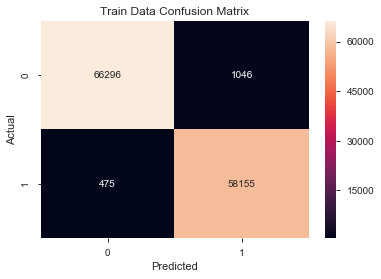

In [72]:
sns.heatmap(conf_metrics_tain, annot=True, fmt='.0f')
plt.title('Train Data Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [73]:
# Confusion metrics of test data.
conf_metrics_test = metrics.confusion_matrix(test_actual_pred.actual, test_actual_pred.predicted )
conf_metrics_test

array([[9328,  383],
       [3227, 9605]], dtype=int64)

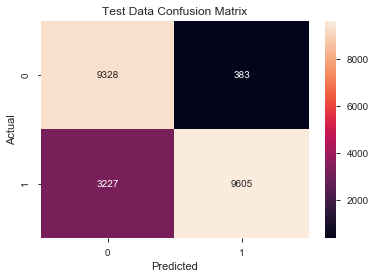

In [74]:
sns.heatmap(conf_metrics_test, annot=True, fmt='.0f')
plt.title('Test Data Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [75]:
#Classification report on Train data
print(metrics.classification_report(train_actual_pred.actual, train_actual_pred.predicted))

              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99     67342
         1.0       0.98      0.99      0.99     58630

   micro avg       0.99      0.99      0.99    125972
   macro avg       0.99      0.99      0.99    125972
weighted avg       0.99      0.99      0.99    125972



In [76]:
#Classification report on Test data
print(metrics.classification_report(test_actual_pred.actual, test_actual_pred.predicted))

              precision    recall  f1-score   support

         0.0       0.74      0.96      0.84      9711
         1.0       0.96      0.75      0.84     12832

   micro avg       0.84      0.84      0.84     22543
   macro avg       0.85      0.85      0.84     22543
weighted avg       0.87      0.84      0.84     22543



# Tuning the parameters using GridSearchCV

In [77]:
param_grid = {'max_depth': np.arange(3, 12),
             'max_features': np.arange(3,12)}

In [78]:
decisionTree = GridSearchCV(DecisionTreeClassifier(), param_grid, cv = 10)
decisionTree.fit( X_train, y_train )

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11]), 'max_features': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [79]:
decisionTree.best_score_

0.9971739751690852

In [80]:
decisionTree.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=11,
            max_features=11, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [81]:
decisionTree.best_params_

{'max_depth': 11, 'max_features': 11}

In [82]:
#So, after tuning the parameters we get that DecisionTreeClassifier work best when parameters are {'max_depth': 11, 'max_features': 11} in this case.

# Building Final Model

In [86]:
bestDecisionTree = DecisionTreeClassifier( max_depth = 11,max_features=11)
bestDecisionTree=bestDecisionTree.fit( X_train, y_train )

In [88]:
pred_train=pd.DataFrame(bestDecisionTree.predict(X_train))
pred_train

,0
0,0.0
1,1.0
2,0.0
3,0.0
4,1.0
5,1.0
6,1.0
7,1.0
8,1.0
9,1.0


In [89]:
train_tree_actual_pred = pd.concat([y_train, pred_train], axis=1)
train_tree_actual_pred.columns = ['actual', 'predicted']
train_tree_actual_pred.head()

,actual,predicted
0,0.0,0.0
1,1.0,1.0
2,0.0,0.0
3,0.0,0.0
4,1.0,1.0


In [90]:
pred_test=pd.DataFrame(decisionTreeClassifier.predict(X_test))
pred_test

,0
0,1.0
1,0.0
2,1.0
3,0.0
4,0.0
5,0.0
6,0.0
7,0.0
8,0.0
9,1.0


In [91]:
test_tree_actual_pred = pd.concat([y_test, pred_test], axis=1)
test_tree_actual_pred.columns = ['actual', 'predicted']
test_tree_actual_pred.head()

,actual,predicted
0,1.0,1.0
1,0.0,0.0
2,1.0,1.0
3,1.0,0.0
4,0.0,0.0


In [92]:
print("Train Accuracy:-")
print(metrics.accuracy_score(train_tree_actual_pred.actual, train_tree_actual_pred.predicted))

print("Test Accuracy:-")
print(metrics.accuracy_score(test_tree_actual_pred.actual, test_tree_actual_pred.predicted))

Train Accuracy:-
0.9982059505286889
Test Accuracy:-
0.8050836179745375


In [93]:
# Confusion metrics of train data.
conf_metrics_tain = metrics.confusion_matrix(train_tree_actual_pred.actual, train_tree_actual_pred.predicted )
conf_metrics_tain

array([[67243,    99],
       [  127, 58503]], dtype=int64)

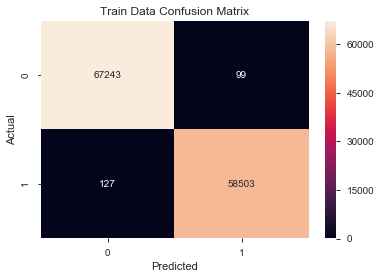

In [94]:
sns.heatmap(conf_metrics_tain, annot=True, fmt='.0f')
plt.title('Train Data Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [95]:
# Confusion metrics of test data.
conf_metrics_test = metrics.confusion_matrix(test_tree_actual_pred.actual, test_tree_actual_pred.predicted )
conf_metrics_test

array([[9332,  379],
       [4015, 8817]], dtype=int64)

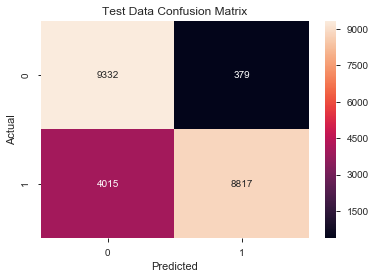

In [96]:
sns.heatmap(conf_metrics_test, annot=True, fmt='.0f')
plt.title('Test Data Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [97]:
#Classification report on train data
print(metrics.classification_report(train_tree_actual_pred.actual, train_tree_actual_pred.predicted))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     67342
         1.0       1.00      1.00      1.00     58630

   micro avg       1.00      1.00      1.00    125972
   macro avg       1.00      1.00      1.00    125972
weighted avg       1.00      1.00      1.00    125972



In [98]:
#Classification report on test data
print(metrics.classification_report(test_tree_actual_pred.actual, test_tree_actual_pred.predicted))

              precision    recall  f1-score   support

         0.0       0.70      0.96      0.81      9711
         1.0       0.96      0.69      0.80     12832

   micro avg       0.81      0.81      0.81     22543
   macro avg       0.83      0.82      0.80     22543
weighted avg       0.85      0.81      0.80     22543



# Feature Importance

In [99]:
bestDecisionTree.feature_importances_

array([9.11559320e-04, 2.59359657e-03, 3.20338299e-05, 5.91280248e-02,
       5.50451036e-01, 1.39315840e-02, 3.51548192e-03, 3.37538836e-03,
       1.79773017e-02, 1.94912609e-03, 4.66408130e-04, 5.15484033e-03,
       2.13091277e-01, 2.30228072e-03, 2.20424271e-04, 3.51963119e-03,
       5.77180295e-04, 6.65775668e-02, 5.38678827e-02, 3.57375792e-04])

In [101]:
#feature importance in dataframe
import itertools
feature_map = [(i, v) for i, v in itertools.zip_longest(X_train.columns, bestDecisionTree.feature_importances_)]
Feature_importance = pd.DataFrame(feature_map, columns=['Feature', 'importance'])
Feature_importance.sort_values('importance', inplace=True, ascending=False)
Feature_importance

,Feature,importance
4,diff_srv_rate,0.550451
12,last_flag,0.213091
17,src_bytes,0.066578
3,count,0.059128
18,srv_count,0.053868
8,dst_host_same_src_port_rate,0.017977
5,dst_bytes,0.013932
11,hot,0.005155
15,service_http,0.003520
6,dst_host_count,0.003515
